In [2]:
wsi_path = r"/mnt/d/original_scans/NikonS60/22 B 07247 D1.ndpi"
tile_size = 360
output_dir = "_jupyter_tests/"
n = 2048

In [3]:
import os
import openslide

slide_id, _ = os.path.splitext(os.path.basename(wsi_path))
wsi = openslide.open_slide(wsi_path)

In [4]:
QC_DIR = os.path.join(output_dir, "QC")
TILE_DIR = os.path.join(output_dir, "train")
slide_dir = os.path.join(TILE_DIR, slide_id)

os.makedirs(QC_DIR, exist_ok=True)
os.makedirs(TILE_DIR, exist_ok=True)
os.makedirs(slide_dir, exist_ok=True)

In [5]:
def write_report_block(title, rows, report_file : None):
    header = f"\n========== {title} ==========\n"
    columns = f"{'Phase':<35} {'Value':<40}\n"
    line = "-" * 80 + "\n"

    if report_file is not None:
        report_file.write(header)
        report_file.write(columns)
        report_file.write(line)

    print(header.strip())
    print(columns.strip())
    print(line.strip())

    for phase, value in rows:
        value_str = str(value)  # <-- FIX CRITICO
        row = f"{phase:<35} {value_str:<40}\n"
        if report_file is not None:
            report_file.write(row)
        print(row.strip())

In [6]:
import sys
write_report_block("WSI SUMMARY", [
        ("Slide ID", slide_id),("Slide Path",wsi_path),
        ("Dimensions", str(wsi.dimensions)),
        ("Levels", str(wsi.level_downsamples)),
        ("Level dimensions", str(wsi.level_dimensions)),
        ("Objective power", str(wsi.properties.get(openslide.PROPERTY_NAME_OBJECTIVE_POWER, 'unknown'))),
        ("MPP", f"{wsi.properties.get(openslide.PROPERTY_NAME_MPP_X, 'unknown')} x {wsi.properties.get(openslide.PROPERTY_NAME_MPP_Y, 'unknown')}")
    ], None)

========== WSI SUMMARY ==========
Phase                               Value
--------------------------------------------------------------------------------
Slide ID                            22 B 07247 D1
Slide Path                          /mnt/d/original_scans/NikonS60/22 B 07247 D1.ndpi
Dimensions                          (161280, 96768)
Levels                              (1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0)
Level dimensions                    ((161280, 96768), (80640, 48384), (40320, 24192), (20160, 12096), (10080, 6048), (5040, 3024), (2520, 1512), (1260, 756), (630, 378), (315, 189))
Objective power                     40
MPP                                 0.22101401228837908 x 0.22101401228837908


# 0. WSI Info

# 1. Tissue Masking

In [7]:
seg_level = wsi.get_best_level_for_downsample(64)
seg_level

6

In [8]:
wsi.level_downsamples[6]

64.0

In [9]:
wsi.level_dimensions[6]

(2520, 1512)

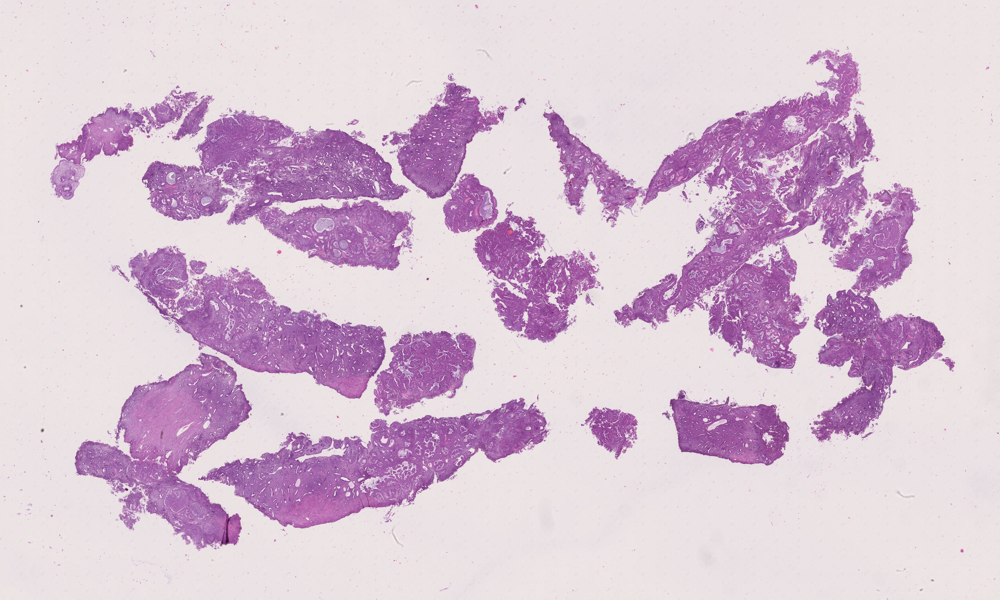

In [10]:
img = wsi.read_region((0, 0), 6, wsi.level_dimensions[6])
img

In [11]:
import numpy as np
import cv2
from shapely.affinity import scale
from shapely.geometry import Polygon

def _segment_tissue(img):
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    mthresh = 7
    img_med = cv2.medianBlur(img_hsv[:, :, 1], mthresh)
    _, img_prepped = cv2.threshold(img_med, 0, 255, cv2.THRESH_OTSU + cv2.THRESH_BINARY)

    close = 4
    kernel = np.ones((close, close), np.uint8)
    img_prepped = cv2.morphologyEx(img_prepped, cv2.MORPH_CLOSE, kernel)

    # Find and filter contours
    contours, hierarchy = cv2.findContours(
        img_prepped, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_NONE
    )
    return contours, hierarchy

def _construct_polygon(foreground_contours, hole_contours, min_area):
    from shapely.ops import unary_union
    polys = []
    for foreground, holes in zip(foreground_contours, hole_contours):
        # We remove all contours that consist of fewer than 3 points, as these won't work with the Polygon constructor.
        if len(foreground) < 3:
            continue

        # remove redundant dimensions from the contour and convert to Shapely Polygon
        poly = Polygon(np.squeeze(foreground))

        # discard all polygons that are considered too small
        if poly.area < min_area:
            continue

        if not poly.is_valid:
            # This is likely becausee the polygon is self-touching or self-crossing.
            # Try and 'correct' the polygon using the zero-length buffer() trick.
            # See https://shapely.readthedocs.io/en/stable/manual.html#object.buffer
            poly = poly.buffer(0)

        # Punch the holes in the polygon
        for hole_contour in holes:
            if len(hole_contour) < 3:
                continue

            hole = Polygon(np.squeeze(hole_contour))

            if not hole.is_valid:
                continue

            # ignore all very small holes
            if hole.area < min_area:
                continue

            poly = poly.difference(hole)

        polys.append(poly)

    if len(polys) == 0:
        raise Exception("Raw tissue mask consists of 0 polygons")

    # If we have multiple polygons, we merge any overlap between them using unary_union().
    # This will result in a Polygon or MultiPolygon with most tissue masks.
    return unary_union(polys)

def _detect_foreground(contours, hierarchy):
    hierarchy = np.squeeze(hierarchy, axis=(0,))[:, 2:]

    # find foreground contours (parent == -1)
    hierarchy_1 = np.flatnonzero(hierarchy[:, 1] == -1)
    foreground_contours = [contours[cont_idx] for cont_idx in hierarchy_1]

    all_holes = []
    for cont_idx in hierarchy_1:
        all_holes.append(np.flatnonzero(hierarchy[:, 1] == cont_idx))

    hole_contours = []
    for hole_ids in all_holes:
        holes = [contours[idx] for idx in hole_ids]
        hole_contours.append(holes)

    return foreground_contours, hole_contours

def create_tissue_mask(wsi, seg_level, report_file=None):

    rows = []

    # --- STEP 1: dimensioni livello ---
    level_dims = wsi.level_dimensions[seg_level]
    level_area = level_dims[0] * level_dims[1]

    rows.append(("Segmentation level", seg_level))
    rows.append(("Level dimensions", level_dims))
    rows.append(("Level area (pixels)", level_area))

    write_report_block("WSI LEVEL INFO", rows, report_file)

    # --- STEP 2: lettura immagine ---
    img = np.array(wsi.read_region((0, 0), seg_level, level_dims))

    rows = []
    rows.append(("Image shape", img.shape))
    rows.append(("Image dtype", img.dtype))

    write_report_block("IMAGE ACQUISITION", rows, report_file)

    # --- STEP 3: min_area ---
    min_area = level_area / 500

    rows = []
    rows.append(("Min polygon area", min_area))

    write_report_block("AREA THRESHOLD", rows, report_file)

    # --- STEP 4: segmentazione ---
    contours, hierarchy = _segment_tissue(img)

    rows = []
    rows.append(("Total contours found", len(contours)))
    rows.append(("Hierarchy shape", hierarchy.shape))

    write_report_block("SEGMENTATION", rows, report_file)

    # --- STEP 5: foreground / holes ---
    foreground_contours, hole_contours = _detect_foreground(contours, hierarchy)

    rows = []
    rows.append(("Foreground contours", len(foreground_contours)))
    rows.append(("Hole groups", len(hole_contours)))

    holes_count = sum(len(h) for h in hole_contours)
    rows.append(("Total hole contours", holes_count))

    write_report_block("FOREGROUND & HOLES", rows, report_file)

    # --- STEP 6: costruzione poligoni ---
    tissue_mask = _construct_polygon(foreground_contours, hole_contours, min_area)

    rows = []
    rows.append(("Tissue mask type", type(tissue_mask).__name__))
    rows.append(("Tissue mask area", tissue_mask.area))
    rows.append(("Is valid polygon", tissue_mask.is_valid))

    write_report_block("POLYGON CONSTRUCTION", rows, report_file)

    # --- STEP 7: scaling ---
    scale_factor = wsi.level_downsamples[seg_level]

    tissue_mask_scaled = scale(
        tissue_mask,
        xfact=scale_factor,
        yfact=scale_factor,
        zfact=1.0,
        origin=(0, 0)
    )

    rows = []
    rows.append(("Scale factor", scale_factor))
    rows.append(("Scaled mask area", tissue_mask_scaled.area))

    write_report_block("SCALING TO LEVEL 0", rows, report_file)

    return tissue_mask_scaled


In [12]:
tissue_mask_scaled = create_tissue_mask(wsi, seg_level=wsi.get_best_level_for_downsample(64))

========== WSI LEVEL INFO ==========
Phase                               Value
--------------------------------------------------------------------------------
Segmentation level                  6
Level dimensions                    (2520, 1512)
Level area (pixels)                 3810240
========== IMAGE ACQUISITION ==========
Phase                               Value
--------------------------------------------------------------------------------
Image shape                         (1512, 2520, 4)
Image dtype                         uint8
========== AREA THRESHOLD ==========
Phase                               Value
--------------------------------------------------------------------------------
Min polygon area                    7620.48
========== SEGMENTATION ==========
Phase                               Value
--------------------------------------------------------------------------------
Total contours found                388
Hierarchy shape                     (1, 388, 4)
==

In [13]:
type(tissue_mask_scaled)

shapely.geometry.multipolygon.MultiPolygon

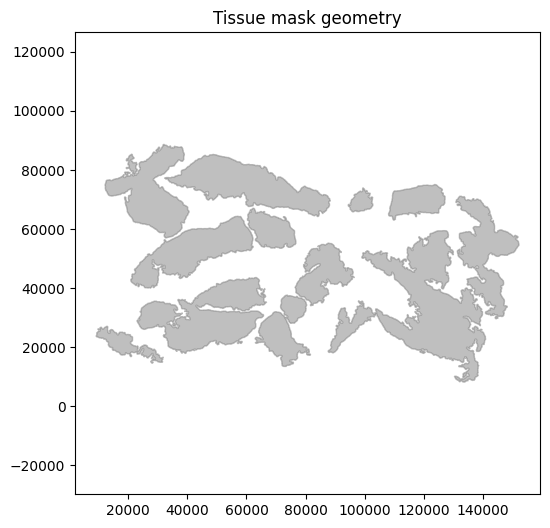

In [14]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6,6))

if tissue_mask_scaled.geom_type == "MultiPolygon":
    for poly in tissue_mask_scaled.geoms:
        x, y = poly.exterior.xy
        plt.fill(x, y, color='gray', alpha=0.5)  # <- colore fisso
else:
    x, y = tissue_mask_scaled.exterior.xy
    plt.fill(x, y, color='gray', alpha=0.5)  # <- colore fisso

plt.axis("equal")
plt.title("Tissue mask geometry")
plt.show()

In [15]:
def _generate_tiles(
    tile_width_pix, tile_height_pix, img_width, img_height, offsets=[(0, 0)]
):
    # Generate tiles covering the entire image.
    # Provide an offset (x,y) to create a stride-like overlap effect.
    # Add an additional tile size to the range stop to prevent tiles being cut off at the edges.
    range_stop_width = int(np.ceil(img_width + tile_width_pix))
    range_stop_height = int(np.ceil(img_height + tile_height_pix))

    rects = []
    for xmin, ymin in offsets:
        cols = range(int(np.floor(xmin)), range_stop_width, tile_width_pix)
        rows = range(int(np.floor(ymin)), range_stop_height, tile_height_pix)
        for x in cols:
            for y in rows:
                rect = Polygon(
                    [
                        (x, y),
                        (x + tile_width_pix, y),
                        (x + tile_width_pix, y - tile_height_pix),
                        (x, y - tile_height_pix),
                    ]
                )
                rects.append(rect)
    return rects

def create_tissue_tiles(
    wsi, tissue_mask_scaled, tile_size_microns, offsets_micron=None
):

    print(f"tile size is {tile_size_microns} um")

    # Compute the tile size in pixels from the desired tile size in microns and the image resolution
    assert (
        openslide.PROPERTY_NAME_MPP_X in wsi.properties
    ), "microns per pixel along X-dimension not available"
    assert (
        openslide.PROPERTY_NAME_MPP_Y in wsi.properties
    ), "microns per pixel along Y-dimension not available"

    mpp_x = float(wsi.properties[openslide.PROPERTY_NAME_MPP_X])
    mpp_y = float(wsi.properties[openslide.PROPERTY_NAME_MPP_Y])
    mpp_scale_factor = min(mpp_x, mpp_y)
    if mpp_x != mpp_y:
        print(
            f"mpp_x of {mpp_x} and mpp_y of {mpp_y} are not the same. Using smallest value: {mpp_scale_factor}"
        )

    tile_size_pix = round(tile_size_microns / mpp_scale_factor)

    # Use the tissue mask bounds as base offsets (+ a margin of a few tiles) to avoid wasting CPU power creating tiles that are never going
    # to be inside the tissue mask.
    tissue_margin_pix = tile_size_pix * 2
    minx, miny, maxx, maxy = tissue_mask_scaled.bounds
    min_offset_x = minx - tissue_margin_pix
    min_offset_y = miny - tissue_margin_pix
    offsets = [(min_offset_x, min_offset_y)]

    if offsets_micron is not None:
        assert (
            len(offsets_micron) > 0
        ), "offsets_micron needs to contain at least one value"
        # Compute the offsets in micron scale
        offset_pix = [round(o / mpp_scale_factor) for o in offsets_micron]
        offsets = [(o + min_offset_x, o + min_offset_y) for o in offset_pix]

    # Generate tiles covering the entire WSI
    all_tiles = _generate_tiles(
        tile_size_pix,
        tile_size_pix,
        maxx + tissue_margin_pix,
        maxy + tissue_margin_pix,
        offsets=offsets,
    )

    # Retain only the tiles that sit within the tissue mask polygon
    filtered_tiles = [rect for rect in all_tiles if tissue_mask_scaled.intersects(rect)]

    return filtered_tiles


In [16]:
tiles = create_tissue_tiles(wsi,tissue_mask_scaled,tile_size_microns=360)

tile size is 360 um


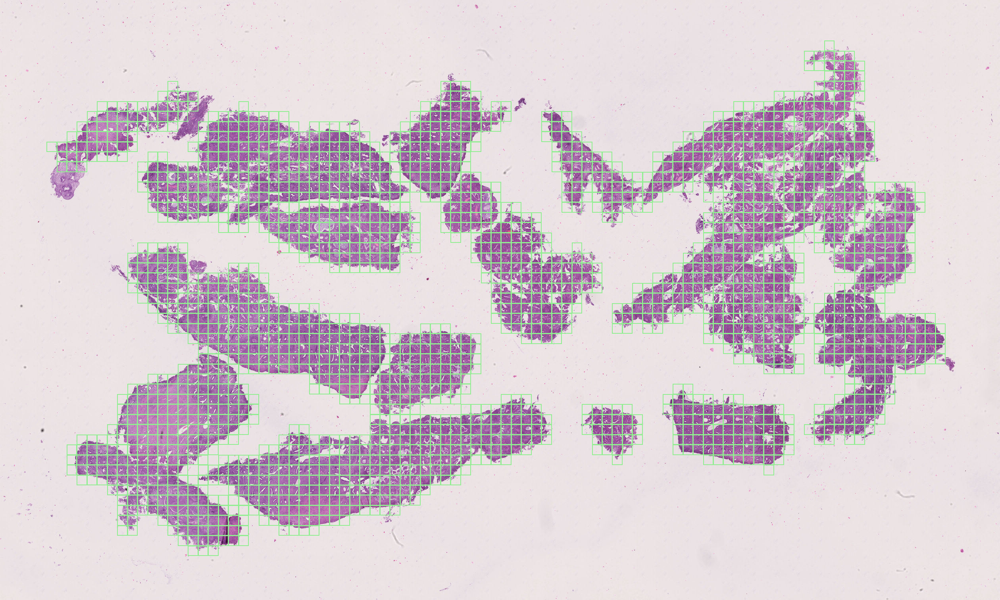

In [17]:
from preprocess import make_tile_QC_fig
qc_img = make_tile_QC_fig(tiles, wsi, seg_level, 2)
qc_img

# Tiling stats

In [18]:
import pandas as pd

mounted = "/mnt/"
romantic = pd.read_excel(mounted + "d/scans_metadata/romantic_wsi_scans.xlsx")

romanticFiltered = romantic[~romantic['p53_inconsistency'] & ~romantic['corrupted']]
romanticDistrFiltered = romanticFiltered['Molecular risk group'].value_counts().to_dict()


In [19]:
romanticFiltered

,wsi_id,corrupted,scanner,mpp,mpp_x,mpp_y,objective_power,notes,path_WIN,path_WSL,Molecular risk group,p53_inconsistency
0,22 B 13385 C9,False,panoramic,0.242535,0.242535,0.242647,20.0,NaN,D:\original_scans\panoramic\22 B 13385 C9.mrxs,/mnt/d/original_scans/panoramic/22 B 13385 C9....,NMSP,False
1,22 B 14380 A10,False,panoramic,0.242535,0.242535,0.242647,20.0,NaN,D:\original_scans\panoramic\22 B 14380 A10.mrxs,/mnt/d/original_scans/panoramic/22 B 14380 A10...,NMSP,False
2,22 B 14545 C7,False,panoramic,0.121267,0.121267,0.121324,40.0,NaN,D:\original_scans\panoramic\22 B 14545 C7.mrxs,/mnt/d/original_scans/panoramic/22 B 14545 C7....,p53 MT,False
3,22 B 15364 A6,False,panoramic,0.242535,0.242535,0.242647,20.0,NaN,D:\original_scans\panoramic\22 B 15364 A6.mrxs,/mnt/d/original_scans/panoramic/22 B 15364 A6....,MMRd,False
4,22 B 15598 A2,False,panoramic,0.242535,0.242535,0.242647,20.0,NaN,D:\original_scans\panoramic\22 B 15598 A2.mrxs,/mnt/d/original_scans/panoramic/22 B 15598 A2....,MMRd,False
...,...,...,...,...,...,...,...,...,...,...,...,...
592,24 B 24146 D7,False,nikon,0.221014,0.221014,0.221014,40.0,NaN,D:\original_scans\NikonS60\24 B 24146 D7.ndpi,/mnt/d/original_scans/NikonS60/24 B 24146 D7.ndpi,NMSP,False
593,24 B 25794 H7,False,nikon,0.221014,0.221014,0.221014,40.0,NaN,D:\original_scans\NikonS60\24 B 25794 H7.ndpi,/mnt/d/original_scans/NikonS60/24 B 25794 H7.ndpi,MMRd,False
594,24 B 25892 D8,False,nikon,0.221014,0.221014,0.221014,40.0,NaN,D:\original_scans\NikonS60\24 B 25892 D8.ndpi,/mnt/d/original_scans/NikonS60/24 B 25892 D8.ndpi,POLE,False
595,24 B 27241 A9,False,nikon,0.221014,0.221014,0.221014,40.0,NaN,D:\original_scans\NikonS60\24 B 27241 A9.ndpi,/mnt/d/original_scans/NikonS60/24 B 27241 A9.ndpi,NMSP,False


In [20]:
romanticFiltered.loc[0,"path_WSL"]

'/mnt/d/original_scans/panoramic/22 B 13385 C9.mrxs'

In [21]:
wsi_id = os.path.basename(wsi_path).split('.')[0]
romantic[romantic['wsi_id'] == wsi_id].reset_index().loc[0,"path_WSL"] == wsi_path

True

In [22]:
romantic.set_index("wsi_id").loc[wsi_id,"path_WSL"]

'/mnt/d/original_scans/NikonS60/22 B 07247 D1.ndpi'

In [35]:
# Reading from WSI test
panoramic = romantic[romantic['scanner'] == "panoramic"]
unsupported = 0
panoramic_readable = []
panoramic_unreadable = []
for id,row in panoramic.iterrows():
    slide_path = romantic.set_index("wsi_id").loc[row["wsi_id"],"path_WSL"]
    try : 
        openslide.OpenSlide(slide_path)
        panoramic_readable.append(slide_path)
    except :
        unsupported += 1
        panoramic_unreadable.append(slide_path)
print(f"Supported Panoramic Slides (LINUX): {len(panoramic_readable)}/{panoramic.shape[0]}")

Supported Panoramic Slides (LINUX): 15/221


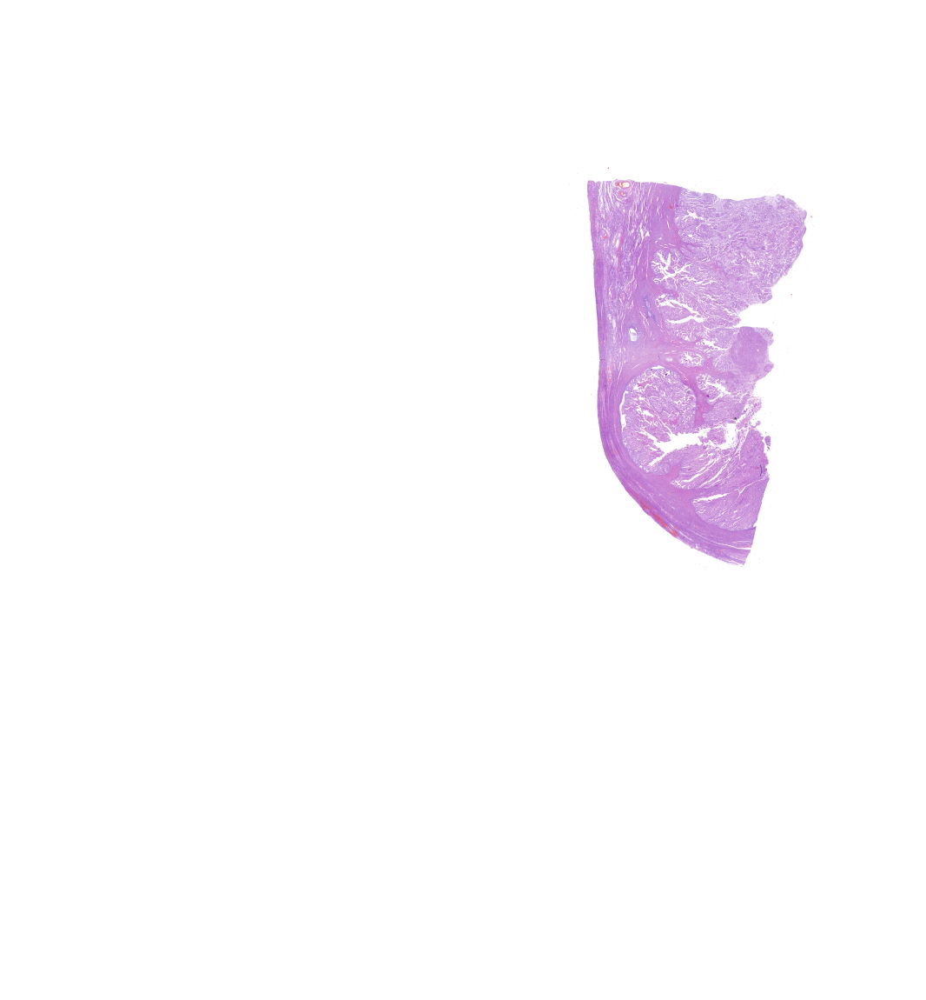

In [24]:
openslide.OpenSlide(panoramic_readable[0]).associated_images['thumbnail']

In [ ]:
print(panoramic_unreadable[0])
print(panoramic_readable[0])

/mnt/d/original_scans/panoramic/22 B 13385 C9.mrxs
/mnt/d/original_scans/panoramic/22 B 14545 C7.mrxs


In [34]:
print(len(panoramic_unreadable[0]))
print(len(panoramic_readable[0]))


50
50


## TRIDENT

In [25]:
wsi.level_dimensions[1]

(80640, 48384)

In [26]:
# Risoluzione in micron/pixel a livello 0
mpp_x = float(wsi.properties['openslide.mpp-x'])
mpp_y = float(wsi.properties['openslide.mpp-y'])
mpp_x == mpp_y

True

In [27]:
mpp_x * wsi.level_downsamples[1]

0.44202802457675816

In [28]:
patch_size_trident = 256
mpp_x * wsi.level_downsamples[1] * patch_size_trident

113.15917429165009